In [12]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.patches import Rectangle
from scipy.sparse import diags
from scipy.sparse.linalg import spsolve
from IPython.display import HTML

In [13]:
hbar = 1.0          # Reduced Planck constant
m = 1.0             # Electron mass
e = 1.0             # Elementary charge

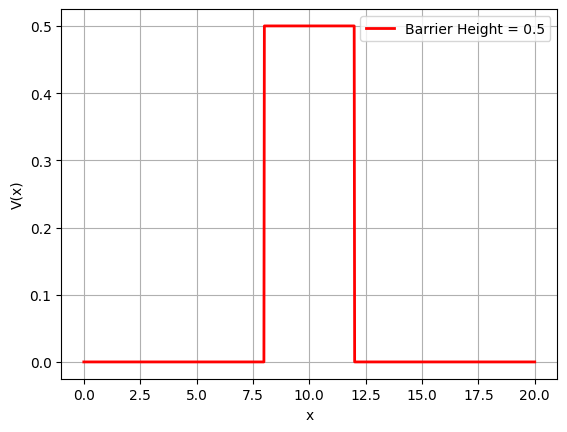

In [14]:
barrier_start = 8.0
barrier_end = 12.0  
barrier_width = barrier_end - barrier_start
x=np.linspace(0, 20, 1000)
V0 = 0.5
V = np.zeros_like(x)
barrier_mask = (x >= barrier_start) & (x <= barrier_end)
V[barrier_mask] = V0
plt.plot(x, V, 'r-', linewidth=2, label=f'Barrier Height = {V0}')
plt.xlabel('x')
plt.ylabel('V(x)')
plt.grid(True)
plt.legend()
plt.show()

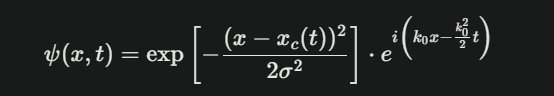

In [15]:
def psi(x, t, k0, sigma, x0):
    x_center = x0 + k0 * t
    envelope = np.exp(-(x - x_center)**2 / (2 * sigma**2))
    phase = np.exp(1j * (k0 * x - (k0**2) * t / 2))
    return envelope * phase

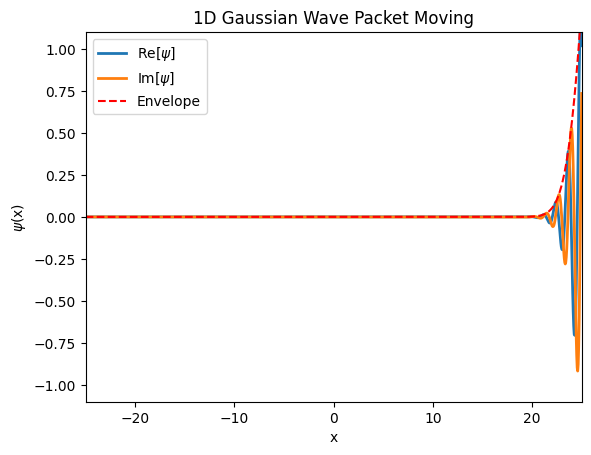

In [17]:
x = np.linspace(-25, 25, 1000)
dx = x[1] - x[0]
k0 = 5.0
sigma = 2
x0 = -22
dt=0.05
steps = 200


fig1, ax1 = plt.subplots()
line_real, = ax1.plot([], [], label='Re[$\\psi$]', lw=2)
line_imag, = ax1.plot([], [], label='Im[$\\psi$]', lw=2)
line_env, = ax1.plot([], [], 'r--', label='Envelope')
ax1.set_xlim(-25, 25)
ax1.set_ylim(-1.1, 1.1)
ax1.set_xlabel('x')
ax1.set_ylabel('$\\psi$(x)')
ax1.set_title('1D Gaussian Wave Packet Moving')
ax1.legend()

def init():
    line_real.set_data([], [])
    line_imag.set_data([], [])
    line_env.set_data([], [])
    return line_real, line_imag, line_env

def animate(i):
    t = i * dt
    wave = psi(x, t, k0, sigma, x0)
    wave = wave / np.sqrt(np.sum(np.abs(wave)**2) * dx)
    line_real.set_data(x, np.real(wave))
    line_imag.set_data(x, np.imag(wave))
    line_env.set_data(x, abs(wave))
    
    return line_real, line_imag, line_env

anim = animation.FuncAnimation(fig1, animate, init_func=init,
                               frames=steps, interval=50, blit=True)
HTML(anim.to_jshtml())